In [1]:
import numpy as np
import h5py as h5
import fitsio as fio

In [2]:
root = '/hpc/group/cosmology/masaya/flamingo/'
f_snap = h5.File(root + 'flamingo_0077.hdf5', 'r')

In [3]:
f_snap.keys()

<KeysViewHDF5 ['BHParticles', 'Cells', 'Code', 'Cosmology', 'DMParticles', 'GasParticles', 'GravityScheme', 'Header', 'HydroScheme', 'ICs_parameters', 'InternalCodeUnits', 'NeutrinoParticles', 'Parameters', 'PartType0', 'PartType1', 'PartType4', 'PartType5', 'PartType6', 'PhysicalConstants', 'Policy', 'StarsParticles', 'StarsScheme', 'SubgridScheme', 'Units', 'UnusedParameters']>

In [4]:
header = f_snap.get('Header/PartTypeNames')[:]
print(header)

[b'Gas' b'DM' b'DMBackground' b'Sink' b'Stars' b'BH' b'Neutrino']


In [5]:
cells = f_snap.get('Cells') # keys: ['Centres', 'Counts', 'Files', 'Meta-data', 'OffsetsInFile']
dmpart = f_snap.get('DMParticles') # keys: ['Coordinates', 'FOFGroupIDs', 'Masses', 'ParticleIDs', 'Softenings', 'Velocities']
gaspart = f_snap.get('GasParticles') 

# keys: ['ComptonYParameters', 'Coordinates', 'Densities', 'DiffusionParameters', 'ElectronNumberDensities', 'ElementMassFractions', 'Entropies', 'FOFGroupIDs', 
#        'InternalEnergies', 'LaplacianInternalEnergies', 'LastAGNFeedbackScaleFactors', 'Masses', 'MaximalTemperatureScaleFactors', 'MaximalTemperatures', 'MetalMassFractions', 
#.       'ParticleIDs', 'Pressures', 'SmoothedElementMassFractions', 'SmoothedMetalMassFractions', 'SmoothingLengths', 'StarFormationRates', 'Temperatures', 'Velocities', 
#.       'VelocityDivergenceTimeDifferentials', 'VelocityDivergences', 'ViscosityParameters', 'XrayLuminosities', 'XrayPhotonLuminosities']

In [ ]:
dm_coords = np.array(dmpart['Coordinates'])
print(dm_coords.shape)
import numpym.ma as ma
dm_coords = dm_coords[ma.masked_equal(dm_coords, 0)]
print(dm_coords.shape)

In [ ]:
dm_coords = np.array(dmpart['Coordinates']); gas_coords = np.array(gaspart['Coordinates'])
dm_vels = np.array(dmpart['Velocities']); gas_vels = np.array(gaspart['Velocities'])


In [ ]:
dm_coords

# Use swiftsimio

In [2]:
import swiftsimio as sw
filename = '/cosma8/data/dp004/flamingo/Runs/L1000N1800/HYDRO_FIDUCIAL/snapshots/flamingo_0000/flamingo_0000.hdf5'
data = sw.load(filename)

"""
mask = sw.mask(filename)
# The full metadata object is available from within the mask
boxsize = mask.metadata.boxsize
# load_region is a 3x2 list [[left, right], [bottom, top], [front, back]]
load_region = [[0.0 * b, 0.5 * b] for b in boxsize]

# Constrain the mask
mask.constrain_spatial(load_region)

# Now load the snapshot with this mask
data = sw.load(filename, mask=mask)
"""

/cosma/home/do012/dc-yama3/miniforge3/envs/env_dev/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


'\nmask = sw.mask(filename)\n# The full metadata object is available from within the mask\nboxsize = mask.metadata.boxsize\n# load_region is a 3x2 list [[left, right], [bottom, top], [front, back]]\nload_region = [[0.0 * b, 0.5 * b] for b in boxsize]\n\n# Constrain the mask\nmask.constrain_spatial(load_region)\n\n# Now load the snapshot with this mask\ndata = sw.load(filename, mask=mask)\n'

In [10]:
meta = data.metadata
print(meta.hydro_scheme, meta.hydro_info, meta.z)

{'Adiabatic index': array([1.6666666], dtype=float32), 'Alpha viscosity': array([0.1], dtype=float32), 'Alpha viscosity (max)': array([2.], dtype=float32), 'Alpha viscosity (min)': array([0.], dtype=float32), 'Beta viscosity': array([3.], dtype=float32), 'CFL parameter': array([0.2], dtype=float32), 'Diffusion alpha': array([0.], dtype=float32), 'Diffusion alpha (max)': array([1.], dtype=float32), 'Diffusion alpha (min)': array([0.], dtype=float32), 'Diffusion beta': array([1.], dtype=float32), 'Dimension': array([3], dtype=int32), 'Equation of state': b'Ideal gas', 'Hydrogen ionization transition temperature': array([10000.], dtype=float32), 'Hydrogen mass fraction': array([0.752], dtype=float32), 'Initial energy per unit mass [internal units]': array([2.7081258], dtype=float32), 'Initial temperature': array([268.7], dtype=float32), 'Kernel delta N_ngb': array([0.01718224], dtype=float32), 'Kernel eta': array([1.2348], dtype=float32), 'Kernel function': b'Wendland C2', 'Kernel gamma':

In [11]:
data.metadata.gas_properties.field_names

['compton_yparameters',
 'coordinates',
 'densities',
 'electron_number_densities',
 'fofgroup_ids',
 'last_agnfeedback_scale_factors',
 'masses',
 'maximal_temperature_scale_factors',
 'maximal_temperatures',
 'metal_mass_fractions',
 'particle_ids',
 'pressures',
 'smoothed_element_mass_fractions',
 'smoothed_metal_mass_fractions',
 'smoothing_lengths',
 'star_formation_rates',
 'temperatures',
 'velocities',
 'velocity_divergences',
 'xray_luminosities',
 'xray_photon_luminosities']

In [15]:
data.metadata.dark_matter_properties.field_names

['coordinates',
 'fofgroup_ids',
 'masses',
 'particle_ids',
 'softenings',
 'velocities']

In [16]:
dm_coords = data.dark_matter.coordinates#; gas_coords = data.gas.coordinates

In [17]:
print(np.min(data.dark_matter.coordinates, axis=0))
print(np.max(data.dark_matter.coordinates, axis=0))

[ 31.25003432 500.00000494 250.00026724] Mpc (Comoving)
[343.74992934 906.24948724 593.74990467] Mpc (Comoving)


# Visualizations of particles

In [3]:
import matplotlib 
from matplotlib import pyplot as plt
import proplot as pplt
%matplotlib inline

Text(0, 0.5, 'y')

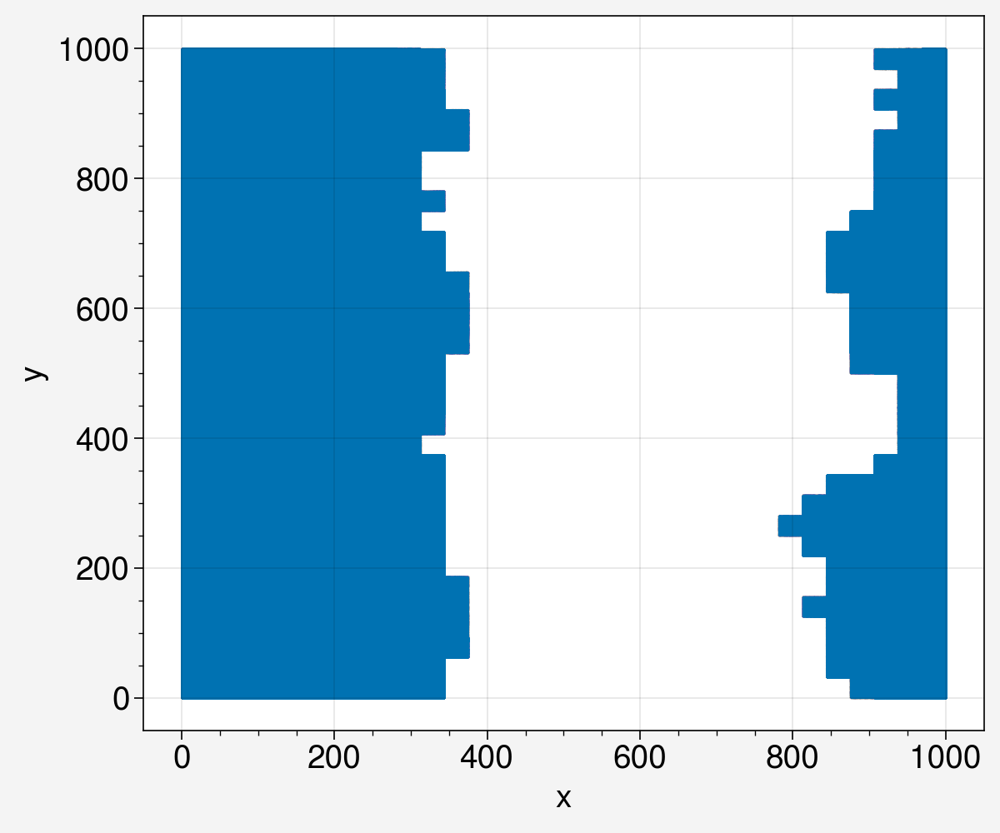

In [5]:
matplotlib.rcParams.update({'font.size':14})

fig,ax = pplt.subplots(nrows=1, ncols=1, figsize=(6,5), sharex=False, sharey=False)
ax.scatter(data.dark_matter.coordinates[:,0], data.dark_matter.coordinates[:,1], s=0.0000001)
ax.set_xlabel('x')
ax.set_ylabel('y')

In [ ]:
matplotlib.rcParams.update({'font.size':14})

fig,ax = pplt.subplots(nrows=1, ncols=3, figsize=(16,5), sharex=False, sharey=False)
ax[0].scatter(dm_coords[:,0], dm_coords[:,1], s=0.000001)
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')

ax[1].scatter(dm_coords[:,1], dm_coords[:,2], s=0.000001)
ax[1].set_xlabel('y')
ax[1].set_ylabel('z')

ax[2].scatter(dm_coords[:,0], dm_coords[:,2], s=0.000001)
ax[2].set_xlabel('x')
ax[2].set_ylabel('z')


In [ ]:
## matplotlib.rcParams.update({'font.size':14})

fig,ax = pplt.subplots(figsize=(20,20))
# ax.scatter(dm_coords[:,0], dm_coords[:,1], s=0.00001, label='DM')
ax.scatter(gas_coords[:,0], gas_coords[:,1], s=0.0005, c='red', alpha=0.5, label='Gas')
ax.set_xlabel('x')
ax.set_ylabel('y')
# ax.legend()
# plt.savefig('flamingo_0000_20x20.jpeg', bbox_inches='tight')


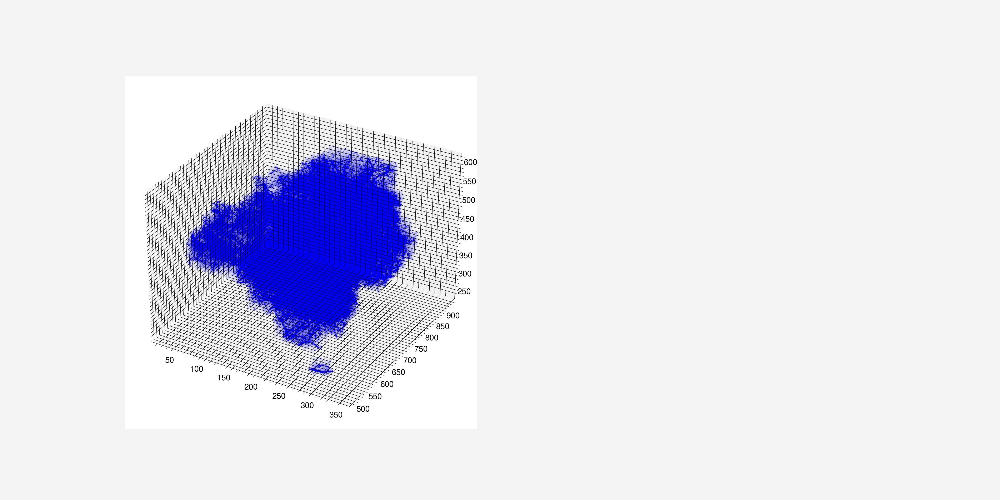

In [19]:
# %matplotlib widget
# from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(24,12))
ax0 = fig.add_subplot(121, projection='3d')
ax0.scatter(dm_coords[:,0], dm_coords[:,1], dm_coords[:,2], s=0.00001, c='blue', alpha=0.5, label='DM')

# ax1 = fig.add_subplot(122, projection='3d')
# ax1.scatter(gas_coords[:,0], gas_coords[:,1], gas_coords[:,2], s=0.00001, c='red', alpha=0.5, label='Gas')

# Computing matter power spectrum of the snapshot

In [13]:

def compute_power_spectrum(overdensity_field, box_size):
    # Fourier transform the overdensity field
    delta_k = np.fft.fftn(overdensity_field)
    delta_k = np.fft.fftshift(delta_k)  # Shift zero frequency component to the center
    
    # Compute the magnitude squared of the Fourier components
    power_spectrum = np.abs(delta_k)**2
    
    # Correct for the volume of the box and the number of grid points
    norm = (box_size / overdensity_field.shape[0])**3
    power_spectrum *= norm
    
    # Compute the wave numbers corresponding to each Fourier mode
    kx = np.fft.fftfreq(overdensity_field.shape[0], d=box_size/overdensity_field.shape[0])
    ky = np.fft.fftfreq(overdensity_field.shape[1], d=box_size/overdensity_field.shape[1])
    kz = np.fft.fftfreq(overdensity_field.shape[2], d=box_size/overdensity_field.shape[2])
    kx, ky, kz = np.meshgrid(kx, ky, kz, indexing='ij')
    kx = np.fft.fftshift(kx)
    ky = np.fft.fftshift(ky)
    kz = np.fft.fftshift(kz)
    k = np.sqrt(kx**2 + ky**2 + kz**2)
    
    # Bin the power spectrum
    k_bins = np.logspace(np.log10(np.min(k[k>0])), np.log10(np.max(k)), num=50)
    k_val = 0.5 * (k_bins[1:] + k_bins[:-1])
    Pk = np.histogram(k.flatten(), bins=k_bins, weights=power_spectrum.flatten())[0]
    Nk = np.histogram(k.flatten(), bins=k_bins)[0]
    Pk = Pk / Nk  # Average the power spectrum in each bin
    
    return k_val, Pk


def read_particle_positions(file_path, particles):
    """Read particle positions from an HDF5 file."""
    with h5.File(file_path, 'r') as f:
        positions = f[particles+'/Coordinates'][:] 
    return positions

def create_density_field(positions, grid_size, box_size):
    """Create a density field using the Cloud-In-Cell (CIC) method."""
    density_field = np.zeros((grid_size, grid_size, grid_size))
    
    # Convert positions to grid indices
    indices = np.floor((positions / box_size) * grid_size).astype(int)
    
    # Assign particle mass to the nearest grid points
    for i in range(len(positions)):
        for offset in [(0,0,0), (0,0,1), (0,1,0), (0,1,1),
                       (1,0,0), (1,0,1), (1,1,0), (1,1,1)]:
            neighbor_index = (indices[i] + offset) % grid_size
            weight = 1.0
            for j in range(3):  # Compute weight based on distance to grid point
                weight *= 1 - abs(indices[i][j] / grid_size * box_size - positions[i][j] + offset[j] * box_size / grid_size)
            density_field[tuple(neighbor_index)] += weight
    
    return density_field

def calculate_overdensity(density_field, apodization=False, sigma=0):
    """Calculate the overdensity field."""
    
    if apodization:
        from scipy.ndimage import gaussian_filter
        density_field = gaussian_filter(density_field, sigma=sigma)
    
    mean_density = np.mean(density_field)
    overdensity_field = (density_field / mean_density) - 1
    return overdensity_field

In [14]:
# Example usage
positions = read_particle_positions(root + 'flamingo_0000.hdf5', 'DMParticles')
grid_size = 512  # Define grid resolution
box_size = 100.0  # Define the size of your simulation box in the same units as positions

density_field = create_density_field(positions, grid_size, box_size)
overdensity_field = calculate_overdensity(density_field, apodization=True, sigma=2.0)

# Now `overdensity_field` contains the matter overdensity data
k, Pk = compute_power_spectrum(overdensity_field, box_size)

/tmp/ipykernel_1398019/618341497.py:28: RuntimeWarning: invalid value encountered in true_divide
  Pk = Pk / Nk  # Average the power spectrum in each bin


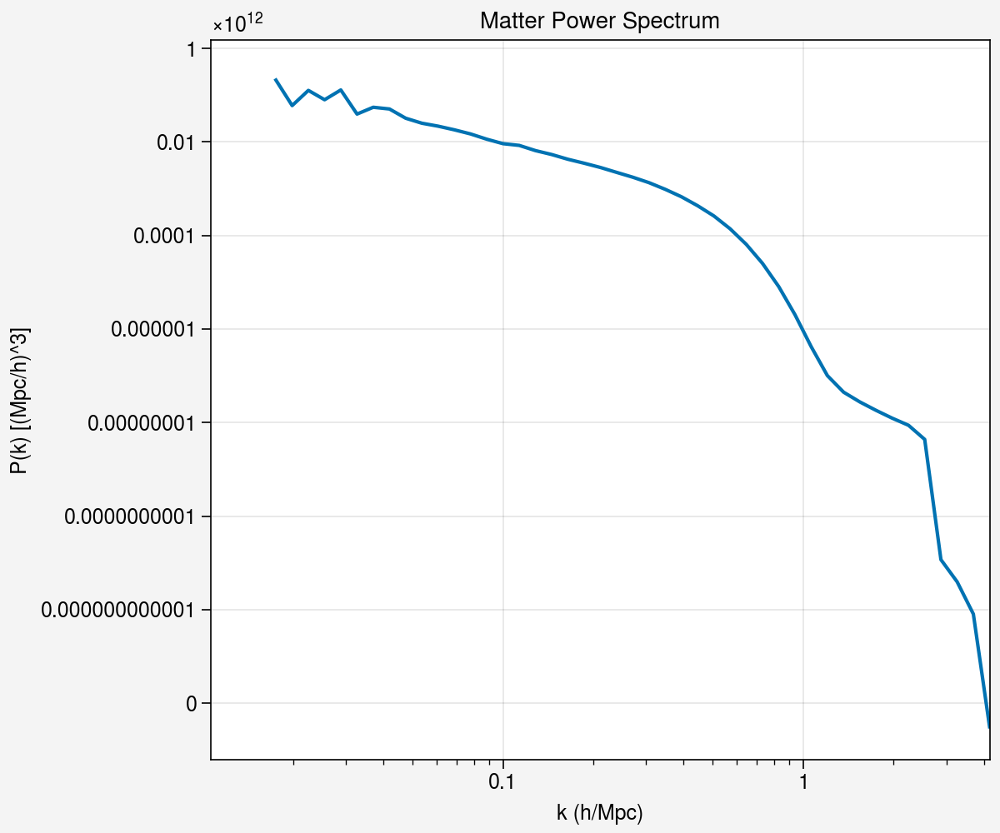

In [15]:
# Plotting the matter power spectrum
fig,ax = pplt.subplots(figsize=(6,5))
ax.loglog(k, Pk)
ax.set_xlabel('k (h/Mpc)')
ax.set_ylabel('P(k) [(Mpc/h)^3]')
ax.set_title('Matter Power Spectrum')
plt.show()

In [26]:
overdensity_field.shape

(512, 512, 512)

Text(0.5, 1.0, 'CIC')

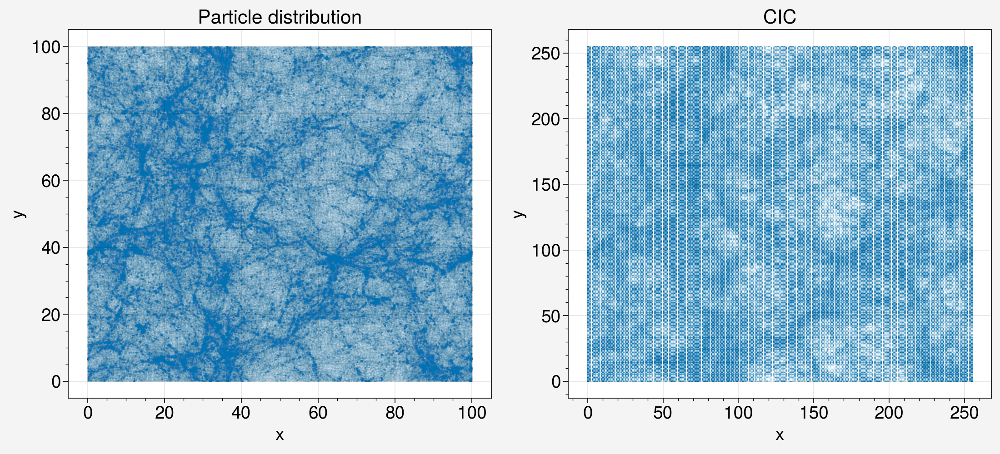

In [27]:
matplotlib.rcParams.update({'font.size':14})

fig,ax = pplt.subplots(nrows=1, ncols=2, figsize=(11,5), sharex=False, sharey=False)
ax[0].scatter(dm_coords[:,0], dm_coords[:,1], s=0.00005)
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
ax[0].set_title('Particle distribution')

ax[1].scatter(x, y, s=0.001)
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')
ax[1].set_title('CIC')

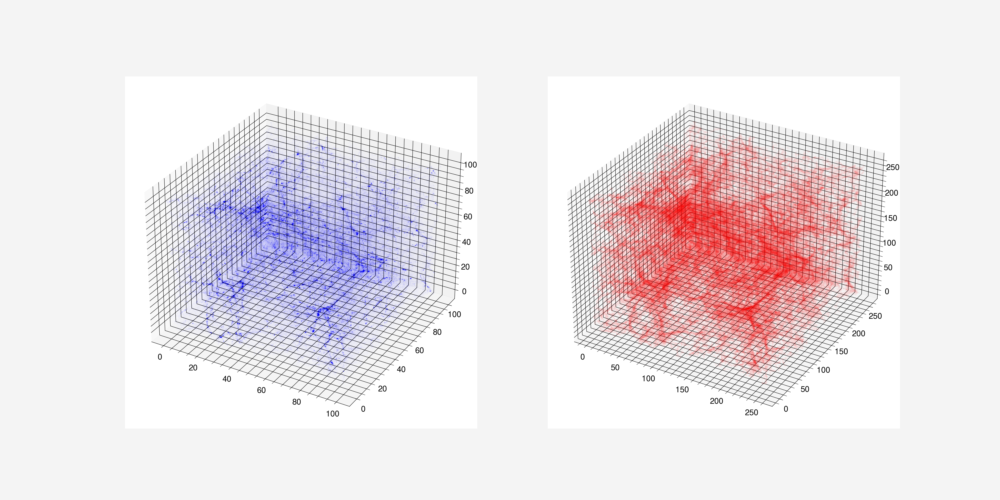

In [18]:
threshold = 1.0  # Example value; adjust based on your data

# Find the indices where the overdensity exceeds the threshold
x, y, z = np.where(overdensity_field > threshold)

fig = plt.figure(figsize=(24,12))
ax0 = fig.add_subplot(121, projection='3d')
ax0.scatter(dm_coords[:,0], dm_coords[:,1], dm_coords[:,2], s=0.00001, c='blue', label='DM')

ax1 = fig.add_subplot(122, projection='3d')
ax1.scatter(x, y, z, s=0.001, c='red', label='CIC')

# Computing the cross power spectrum of overdensity and veloci